## Homework 21: DBSCAN clusters
**Conditions**: 
- Dataset: make_sircles, load_iris

**Goal**: use DBSCAN, KMeans for making clusters, compare results

**Acceptance criteria**: 
- Correct visualization and application of DBSCAN: 50% points.
- High-quality tuning of parameters and conclusions: 30% points.
- Comparison with KMeans and additional assignment: 20% points.

Importing necessary modules and libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_circles, load_iris
from sklearn.cluster import DBSCAN, KMeans, SpectralClustering, OPTICS
from sklearn.preprocessing import StandardScaler

1. <p style="color:red;">Load the make_circles dataset from sklearn.datasets.</p>
Visualize data using matplotlib.

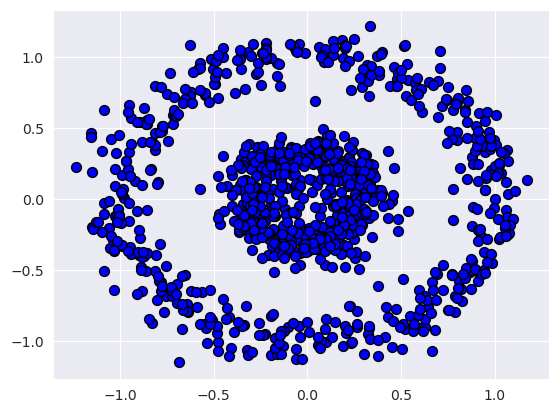

In [2]:
# Load data
X, y = make_circles(n_samples=1000, factor=0.3, noise=0.1)

# Data visualization
plt.scatter(X[:, 0], X[:, 1], c='blue', marker='o', edgecolor='black', s=50)
plt.show()

2. <p style="color:red;">Clustering with DBSCAN:</p>
- Apply DBSCAN to the data. Start with the parameters eps=0.5 and min_samples=5.
- Visualize the clustering results.
- Change the eps and min_samples values for DBSCAN. Try at least three different combinations for each option.
- For each combination, visualize the results and draw conclusions about the impact of these parameters on the clustering result.

DBSCAN
Usage: Non-flat geometry, uneven cluster sizes, outlier removal, transductive
Geometry: Distances between nearest points

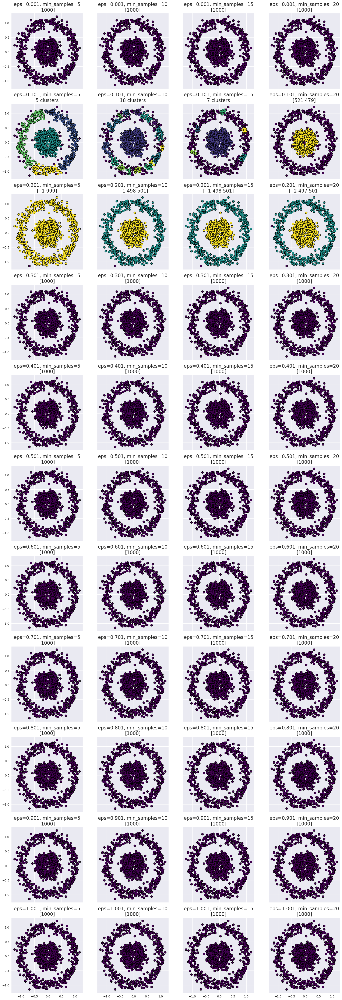

In [3]:
# Setting parameters for the cycle
sample_range = range(5, 25, 5)
eps_range = np.arange(0.001, 1.1, 0.1)

# Creating a grid for graphs
fig, axs = plt.subplots(len(eps_range), len(sample_range), figsize=(20, 60))

# Iterate over the values of min_samples and eps
for i, sample in enumerate(sample_range):
    for j, eps in enumerate(eps_range):
        dbscan = DBSCAN(eps=eps, min_samples=sample)
        clusters = dbscan.fit_predict(X)
        clstr = np.unique(clusters, return_counts=True)

        # Setting up a subplot in a grid
        ax = axs[j, i]
        ax.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
        ax.set_title(f'eps={round(eps, 3)}, min_samples={sample}\n'
                     f'{clstr[1] if len(clstr[1]) <= 3 else f"{len(clstr[1])} clusters"}',fontsize=16)

# Remove unnecessary axes labels
for ax in axs.flat:
    ax.label_outer()

# Displaying graphs
plt.show()

eps = 0.201, min_samples = 10 are the best parameters for this dataset
eps and min_samples values influence on clusters' size and their density

# CONCLUSION

1. **`eps` (Epsilon):** This parameter defines the maximum distance between two data points for one to be considered as in the neighborhood of the other. In other words, it determines the radius of the neighborhood around each data point. Points within this radius are considered neighbors. The choice of `eps` is critical because it directly affects the density and size of the resulting clusters.

   - A smaller `eps` value creates tighter, more compact clusters because it requires points to be very close to each other to be in the same cluster.
   - A larger `eps` value creates larger and potentially more sparse clusters because it allows points to be farther apart while still being in the same cluster.

   The optimal `eps` value depends on the specific characteristics of your dataset, such as the distribution of data points, the density of clusters, and the scale of the data. It often requires experimentation and domain knowledge to select an appropriate `eps` value.

2. **`min_samples`:** This parameter specifies the minimum number of data points that must be within the `eps` radius of a core point for it to be considered a core point. Core points are the central points of clusters. If a point is not a core point but is within the `eps` radius of a core point, it is considered a border point. Points that are not core points and are not within the `eps` radius of any core point are considered noise points.

   - A smaller `min_samples` value requires fewer neighboring points for a point to become a core point. This can result in more small clusters and potentially more noise points.
   - A larger `min_samples` value requires more neighboring points, leading to larger and denser clusters.

   The choice of `min_samples` depends on the desired cluster size and the expected density of clusters. Smaller values may lead to more clusters with fewer data points, while larger values tend to create larger and denser clusters.

The impact of these parameters can be visualized as follows:

- **`eps` Impact:** Varying `eps` can change the shape and size of clusters. Smaller `eps` values produce tighter, more concentrated clusters, while larger values create more extended and potentially overlapping clusters.

- **`min_samples` Impact:** Adjusting `min_samples` can control the threshold for considering a cluster as valid. Smaller `min_samples` values result in clusters with fewer points, potentially identifying more fine-grained patterns. Larger `min_samples` values create clusters with more points and may filter out smaller, less dense clusters.

3. <p style="color:red;">Comparison with KMeans:</p>
Apply the KMeans algorithm to the same data.
Visualize the results and compare with DBSCAN results.

KMeans 
Usage: General-purpose, even cluster size, flat geometry, not too many clusters, inductive
Geometry: Distances between points

/mnt/VOL/anaconda3/envs/teachme/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


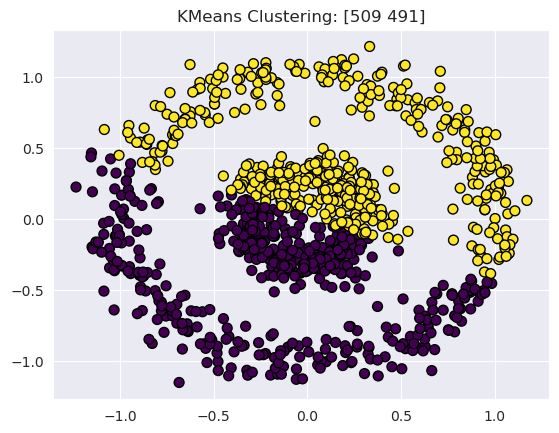

In [4]:
kmeans = KMeans(n_clusters=2)
clusters = kmeans.fit_predict(X)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'KMeans Clustering: {clstr[1]}')
plt.show()

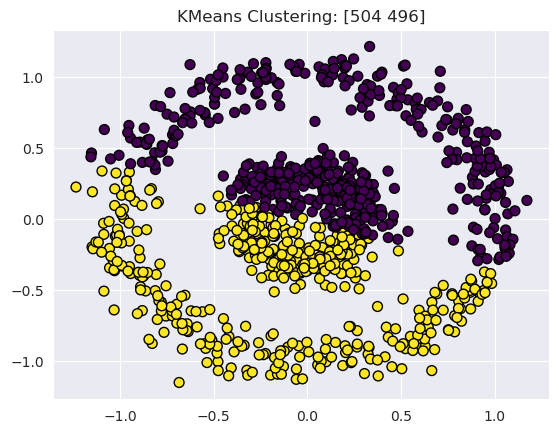

In [5]:
# Let's try to change KMeans parameters
kmeans = KMeans(n_clusters=2, n_init=100, max_iter=500, algorithm='elkan')
clusters = kmeans.fit_predict(X)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'KMeans Clustering: {clstr[1]}')
plt.show()

Let's try some feature engineering.
We will use absolute values

In [6]:
X1 = abs(X)

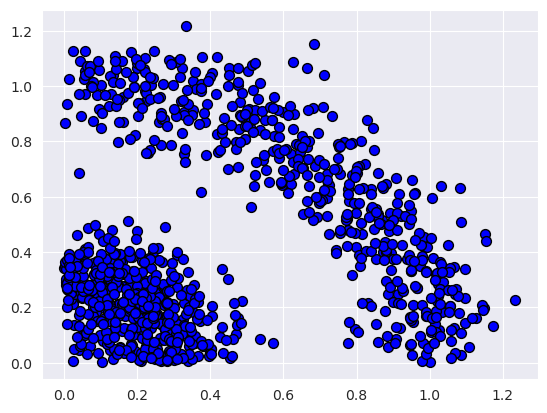

In [7]:
# Let's take a look what we got
plt.scatter(X1[:, 0], X1[:, 1], c='blue', marker='o', edgecolor='black', s=50)
plt.show()

Shape became more simple what is better for KMeans

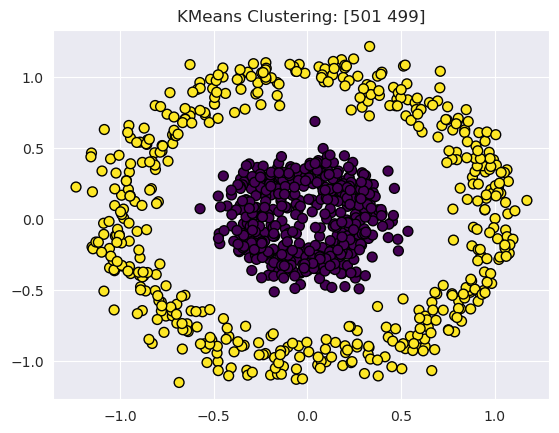

In [8]:
# will use absolute values for prediction, but raw values for the graph
kmeans = KMeans(n_clusters=2, n_init=100, max_iter=500, algorithm='elkan')
clusters = kmeans.fit_predict(X1)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'KMeans Clustering: {clstr[1]}')
plt.show()

# CONCLUSION

1. **Clustering Approach:**
   - **DBSCAN:** DBSCAN is a density-based clustering algorithm. It groups data points together based on their density in the feature space. It identifies dense regions of data points as clusters and can find clusters of arbitrary shapes. DBSCAN is well-suited for datasets with irregularly shaped clusters and varying cluster densities.
   - **K-Means:** K-Means is a centroid-based clustering algorithm. It assigns data points to the nearest cluster centroid, aiming to minimize the within-cluster variance. K-Means forms spherical clusters and works best when clusters are roughly spherical and have similar sizes. It assumes that clusters are of approximately equal size and density.

2. **Cluster Shape:**
   - **DBSCAN:** DBSCAN can discover clusters of arbitrary shapes and sizes. It doesn't make any assumptions about the shape of clusters and is particularly effective at finding clusters with complex geometries.
   - **K-Means:** K-Means assumes that clusters are spherical and equally sized, making it less effective for datasets with non-spherical or differently sized clusters.

3. **Number of Clusters:**
   - **DBSCAN:** DBSCAN does not require you to specify the number of clusters beforehand. It automatically determines the number of clusters based on the density of data points. This is advantageous when the true number of clusters is unknown.
   - **K-Means:** K-Means requires you to specify the number of clusters (K) as a hyperparameter. Choosing the correct value of K can be challenging, and an incorrect choice can lead to suboptimal results.

4. **Handling Noise:**
   - **DBSCAN:** DBSCAN explicitly identifies noise points as data points that do not belong to any cluster. Noise points are labeled as -1. This makes DBSCAN robust to outliers and noise in the data.
   - **K-Means:** K-Means assigns every data point to a cluster, even if it is an outlier. Outliers can significantly influence the centroids and cluster assignments in K-Means.

5. **Initialization:**
   - **DBSCAN:** DBSCAN does not require explicit initialization. It starts with an arbitrary data point and expands clusters based on density.
   - **K-Means:** K-Means initialization often depends on the initial placement of cluster centroids, which can affect the final clustering result. Multiple runs with different initializations are commonly used to mitigate this issue.

6. **Scalability:**
   - **DBSCAN:** DBSCAN can be less scalable, especially for large datasets, because it needs to compute pairwise distances or a neighborhood graph.
   - **K-Means:** K-Means can be more scalable and efficient for large datasets, as it relies on computing centroids and assigning points to clusters iteratively.

In summary, the choice between DBSCAN and K-Means depends on the nature of the data, the shape and size of clusters, the presence of noise, and clustering objectives. DBSCAN is often a good choice when you have little prior knowledge about your data and need a method that can automatically discover clusters of various shapes and handle outliers. K-Means is suitable when you have a prior assumption about the number and shape of clusters, and your data conforms to those assumptions.

4. <p style="color:red;">Other cluster technics</p>

**Spectral Clustering**
Usage: Few clusters, even cluster size, non-flat geometry, transductive
Geometry: Graph distance (e.g. nearest-neighbor graph)

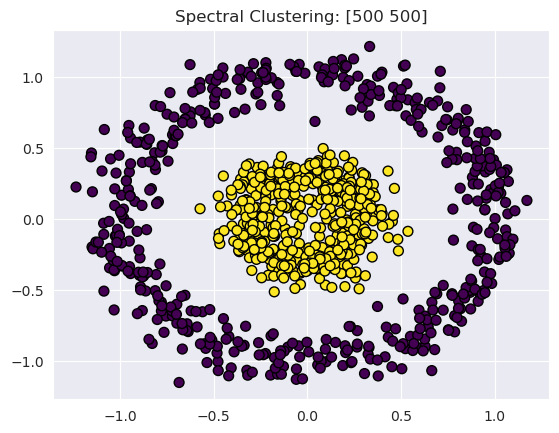

In [9]:
spectral = SpectralClustering(
    n_clusters=2,
    eigen_solver="arpack",
    affinity="nearest_neighbors",
    random_state=42,
)
clusters = spectral.fit_predict(X)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'Spectral Clustering: {clstr[1]}')
plt.show()

**OPTICS**
Usage: Non-flat geometry, uneven cluster sizes, variable cluster density, outlier removal, transductive
Geometry: Distances between points

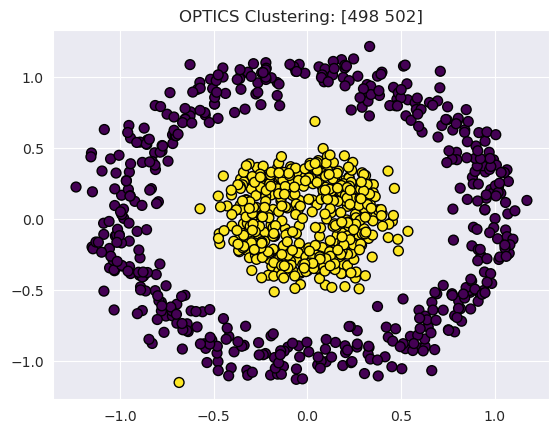

In [10]:
optic = OPTICS(
    min_samples=7,
    xi=0.09,
    min_cluster_size=0.1,
)
clusters = optic.fit_predict(X)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'OPTICS Clustering: {clstr[1]}')
plt.show()

5. <p style="color:red;">DBSCAN on real dataset</p>
Load a real dataset (such as the Iris dataset) and apply DBSCAN to it.
Find the optimal eps and min_samples parameters for this data set.
Visualize the results and draw conclusions.


In [11]:
iris = load_iris()
X = iris.data
y = iris.target

In [12]:
np.unique(y, return_counts=True)

(array([0, 1, 2]), array([50, 50, 50]))

Iris dataset have 3 classes, 50 sampes per each class

In [13]:
# Scaling
X = StandardScaler().fit_transform(X)

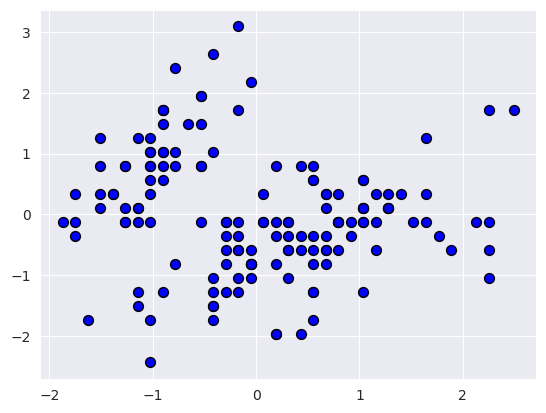

In [14]:
# Visualizing
plt.scatter(X[:, 0], X[:, 1], c='blue', marker='o', edgecolor='black', s=50)
plt.show()

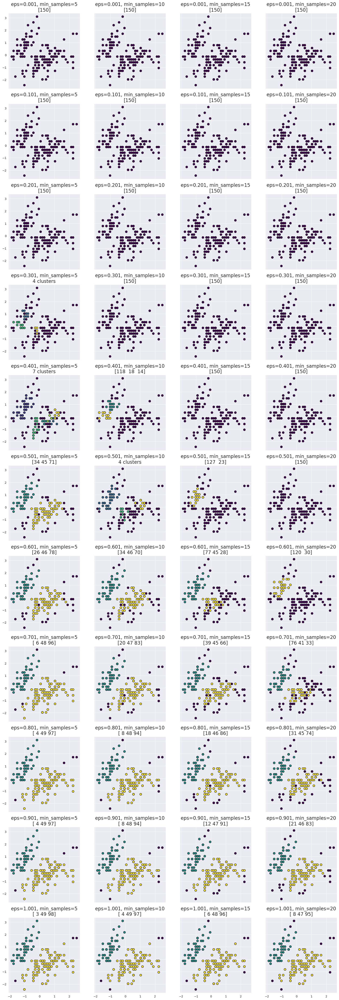

In [15]:
# We will use the code from previous task to draw graphs for different parameters
# So we will be able to choose the best
sample_range = range(5, 25, 5)
eps_range = np.arange(0.001, 1.1, 0.1)

fig, axs = plt.subplots(len(eps_range), len(sample_range), figsize=(20, 60))

for i, sample in enumerate(sample_range):
    for j, eps in enumerate(eps_range):
        dbscan = DBSCAN(eps=eps, min_samples=sample)
        clusters = dbscan.fit_predict(X)
        clstr = np.unique(clusters, return_counts=True)

        ax = axs[j, i]
        ax.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
        ax.set_title(f'eps={round(eps, 3)}, min_samples={sample}\n'
                     f'{clstr[1] if len(clstr[1]) <= 3 else f"{len(clstr[1])} clusters"}',fontsize=16)

for ax in axs.flat:
    ax.label_outer()

plt.show()

esp 0.6-0.7 and min_samples 15-20 showed the best results
Let's reduce cycle step width to check if we can get better results using values from these ranges

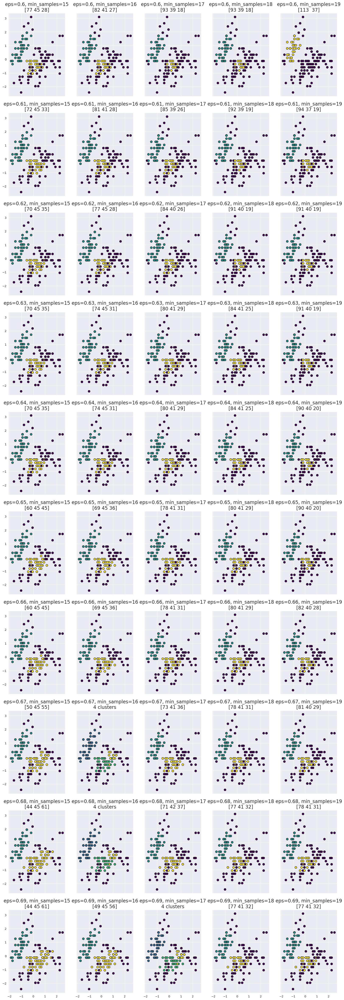

In [16]:
sample_range = range(15, 20) # 15-20
eps_range = np.arange(0.6, 0.7, 0.01) #0.6-0.7

fig, axs = plt.subplots(len(eps_range), len(sample_range), figsize=(20, 60))

for i, sample in enumerate(sample_range):
    for j, eps in enumerate(eps_range):
        dbscan = DBSCAN(eps=eps, min_samples=sample)
        clusters = dbscan.fit_predict(X)
        clstr = np.unique(clusters, return_counts=True)

        ax = axs[j, i]
        ax.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
        ax.set_title(f'eps={round(eps, 3)}, min_samples={sample}\n'
                     f'{clstr[1] if len(clstr[1]) <= 3 else f"{len(clstr[1])} clusters"}',fontsize=16)

for ax in axs.flat:
    ax.label_outer()

plt.show()

eps 0.67, and min_samples 15 look the best anyway

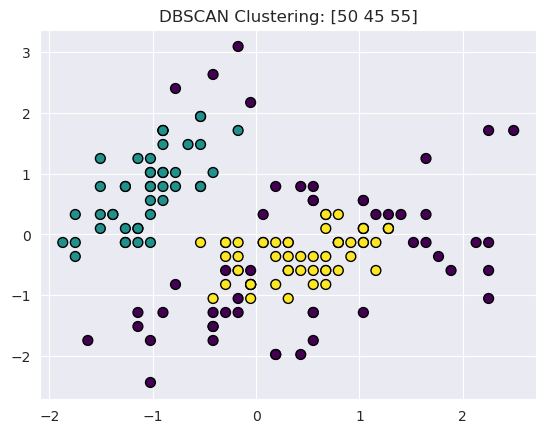

In [17]:
dbscan = DBSCAN(eps=0.67, min_samples=15)
clusters = dbscan.fit_predict(X)
clstr = np.unique(clusters, return_counts=True)
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap="viridis", marker='o', edgecolor='black', s=50)
plt.title(f'DBSCAN Clustering: {clstr[1]}')
plt.show()